In [1]:
import json
import csv
import pandas as pd
import numpy as np
import os
import glob
import re
import matplotlib.pyplot as plt

from feature_extraction import get_dataframe
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [2]:
directory = r"C:\Users\ganes\Downloads\securecomm2018\results"
log_files = glob.glob(os.path.join(directory, "JSONlog-*.json"))
ground_truth_file = glob.glob(os.path.join(directory, "GroundTruthJSONlog*.json"))

In [3]:
ground_truth_file

['C:\\Users\\ganes\\Downloads\\securecomm2018\\results\\GroundTruthJSONlog.json']

In [4]:
logs = get_dataframe(log_files)

C:\Users\ganes\projects\cip_test\json-to-csv\feature_extraction.py:199: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  final_df = pd.concat(dfs, ignore_index=True)


In [5]:
ground_truth = get_dataframe(ground_truth_file)

In [6]:
merged = logs.merge(
    ground_truth,
    on="messageID",
    how="left",
    suffixes=("_log", "_truth")
)

In [7]:
merged.head()

,type_log,rcvTime_log,sendTime_log,sender_log,senderPseudo_log,messageID,pos_x_log,pos_y_log,pos_z_log,pos_noise_x_log,pos_noise_y_log,pos_noise_z_log,spd_x_log,spd_y_log,spd_z_log,spd_noise_x_log,spd_noise_y_log,spd_noise_z_log,acl_x_log,acl_y_log,acl_z_log,acl_noise_x_log,acl_noise_y_log,acl_noise_z_log,hed_x_log,hed_y_log,hed_z_log,hed_noise_x_log,hed_noise_y_log,hed_noise_z_log,receiver_log,type_truth,rcvTime_truth,sendTime_truth,sender_truth,senderPseudo_truth,pos_x_truth,pos_y_truth,pos_z_truth,pos_noise_x_truth,pos_noise_y_truth,pos_noise_z_truth,spd_x_truth,spd_y_truth,spd_z_truth,spd_noise_x_truth,spd_noise_y_truth,spd_noise_z_truth,acl_x_truth,acl_y_truth,acl_z_truth,acl_noise_x_truth,acl_noise_y_truth,acl_noise_z_truth,hed_x_truth,hed_y_truth,hed_z_truth,hed_noise_x_truth,hed_noise_y_truth,hed_noise_z_truth,receiver_truth
0,3,10800.392893,10800.392785,13,,38,3597.152086,5542.199221,1.895,0.0,0.0,0.0,-3.178366,38.798969,0.0,0.0,0.0,0.0,,,,,,,,,,,,,None,4,,,13,,3597.152086,5542.199221,1.895,0.0,0.0,0.0,-3.178366,38.798969,0.0,0.0,0.0,0.0,,,,,,,,,,,,,None
1,3,10800.456258,10800.456150,31,,104,3596.805861,5692.113417,1.895,0.0,0.0,0.0,1.282467,-29.864003,0.0,0.0,0.0,0.0,,,,,,,,,,,,,None,4,,,31,,3596.805861,5692.113417,1.895,0.0,0.0,0.0,1.282467,-29.864003,0.0,0.0,0.0,0.0,,,,,,,,,,,,,None
2,3,10800.582131,10800.582020,25,,137,3597.770493,5764.800893,1.895,0.0,0.0,0.0,-0.020161,-34.568848,0.0,0.0,0.0,0.0,,,,,,,,,,,,,None,4,,,25,,3597.770493,5764.800893,1.895,0.0,0.0,0.0,-0.020161,-34.568848,0.0,0.0,0.0,0.0,,,,,,,,,,,,,None
3,3,10800.670748,10800.670638,43,,172,3822.892006,5266.806009,1.895,0.0,0.0,0.0,1.305362,-0.988730,0.0,0.0,0.0,0.0,,,,,,,,,,,,,None,4,,,43,,3822.892006,5266.806009,1.895,0.0,0.0,0.0,1.305362,-0.988730,0.0,0.0,0.0,0.0,,,,,,,,,,,,,None
4,3,10800.870128,10800.870012,19,,193,3617.100034,5417.782781,1.895,0.0,0.0,0.0,4.937950,-39.877578,0.0,0.0,0.0,0.0,,,,,,,,,,,,,None,4,,,19,,3617.100034,5417.782781,1.895,0.0,0.0,0.0,4.937950,-39.877578,0.0,0.0,0.0,0.0,,,,,,,,,,,,,None


In [9]:
# Position error
merged["pos_error"] = np.sqrt(
    (merged["pos_x_log"] - merged["pos_x_truth"])**2 +
    (merged["pos_y_log"] - merged["pos_y_truth"])**2 +
    (merged["pos_z_log"] - merged["pos_z_truth"])**2
)

# Speed error
merged["spd_error"] = np.sqrt(
    (merged["spd_x_log"] - merged["spd_x_truth"])**2 +
    (merged["spd_y_log"] - merged["spd_y_truth"])**2 +
    (merged["spd_z_log"] - merged["spd_z_truth"])**2
)

# # Acceleration error
# merged["acl_error"] = np.sqrt(
#     (merged["acl_x_log"] - merged["acl_x_truth"])**2 +
#     (merged["acl_y_log"] - merged["acl_y_truth"])**2 +
#     (merged["acl_z_log"] - merged["acl_z_truth"])**2
# )

In [10]:
POS_THR = 0    # meters
SPD_THR = 0    # m/s
ACL_THR = 0    # m/s^2

In [13]:
merged["pos_mismatch"] = merged["pos_error"] > POS_THR
merged["spd_mismatch"] = merged["spd_error"] > SPD_THR
# merged["acl_mismatch"] = merged["acl_error"] > ACL_THR

merged["is_forged"] = (
    merged["pos_mismatch"] 
    | merged["spd_mismatch"] 
    # | merged["acl_mismatch"]
)

In [15]:
sender_stats = (
    merged.groupby("sender_log")
    .agg(
        total_messages=("messageID", "count"),
        forged_messages=("is_forged", "sum"),
        pos_mismatches=("pos_mismatch", "sum"),
        spd_mismatches=("spd_mismatch", "sum"),
        # acl_mismatches=("acl_mismatch", "sum"),
    )
    .reset_index()
)

sender_stats["forged_ratio"] = (
    sender_stats["forged_messages"] /
    sender_stats["total_messages"]
)

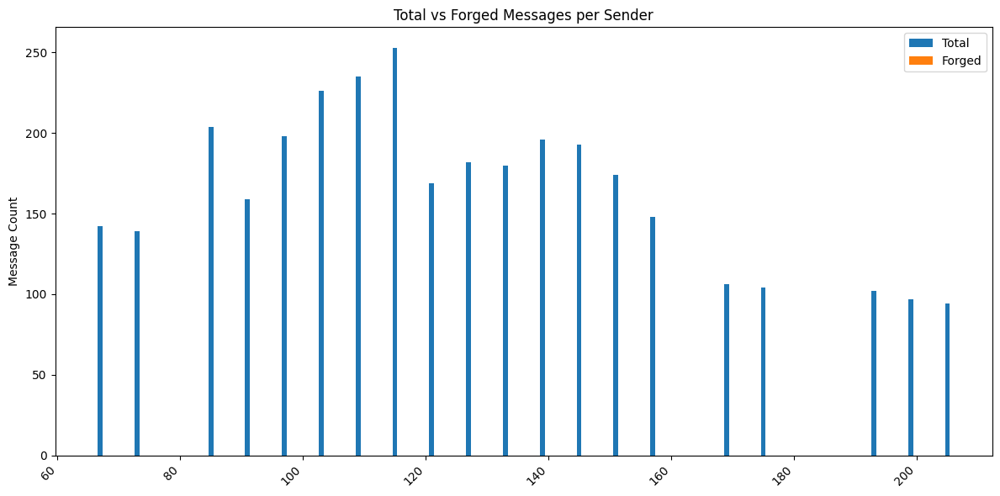

In [16]:
top = sender_stats.sort_values(
    "total_messages", ascending=False
).head(20)

plt.figure(figsize=(12,6))
plt.bar(top["sender_log"], top["total_messages"], label="Total")
plt.bar(top["sender_log"], top["forged_messages"], label="Forged")
plt.xticks(rotation=45, ha="right")
plt.ylabel("Message Count")
plt.title("Total vs Forged Messages per Sender")
plt.legend()
plt.tight_layout()
plt.show()

In [21]:
sender_stats

,sender_log,total_messages,forged_messages,pos_mismatches,spd_mismatches,forged_ratio
0,7,66,0,0,0,0.0
1,13,48,0,0,0,0.0
2,19,23,0,0,0,0.0
3,25,64,0,0,0,0.0
4,31,57,0,0,0,0.0
5,37,4,0,0,0,0.0
6,43,21,0,0,0,0.0
7,49,78,78,78,0,1.0
8,61,61,0,0,0,0.0
9,67,142,0,0,0,0.0


In [26]:
merged

,type_log,rcvTime_log,sendTime_log,sender_log,senderPseudo_log,messageID,pos_x_log,pos_y_log,pos_z_log,pos_noise_x_log,pos_noise_y_log,pos_noise_z_log,spd_x_log,spd_y_log,spd_z_log,spd_noise_x_log,spd_noise_y_log,spd_noise_z_log,acl_x_log,acl_y_log,acl_z_log,acl_noise_x_log,acl_noise_y_log,acl_noise_z_log,hed_x_log,hed_y_log,hed_z_log,hed_noise_x_log,hed_noise_y_log,hed_noise_z_log,receiver_log,type_truth,rcvTime_truth,sendTime_truth,sender_truth,senderPseudo_truth,pos_x_truth,pos_y_truth,pos_z_truth,pos_noise_x_truth,pos_noise_y_truth,pos_noise_z_truth,spd_x_truth,spd_y_truth,spd_z_truth,spd_noise_x_truth,spd_noise_y_truth,spd_noise_z_truth,acl_x_truth,acl_y_truth,acl_z_truth,acl_noise_x_truth,acl_noise_y_truth,acl_noise_z_truth,hed_x_truth,hed_y_truth,hed_z_truth,hed_noise_x_truth,hed_noise_y_truth,hed_noise_z_truth,receiver_truth,pos_error,spd_error,pos_mismatch,spd_mismatch,is_forged
0,3,10800.392893,10800.392785,13,,38,3597.152086,5542.199221,1.895,0.0,0.0,0.0,-3.178366,38.798969,0.0,0.0,0.0,0.0,,,,,,,,,,,,,None,4,,,13,,3597.152086,5542.199221,1.895,0.0,0.0,0.0,-3.178366,38.798969,0.0,0.0,0.0,0.0,,,,,,,,,,,,,None,0.000000,0.0,False,False,False
1,3,10800.456258,10800.456150,31,,104,3596.805861,5692.113417,1.895,0.0,0.0,0.0,1.282467,-29.864003,0.0,0.0,0.0,0.0,,,,,,,,,,,,,None,4,,,31,,3596.805861,5692.113417,1.895,0.0,0.0,0.0,1.282467,-29.864003,0.0,0.0,0.0,0.0,,,,,,,,,,,,,None,0.000000,0.0,False,False,False
2,3,10800.582131,10800.582020,25,,137,3597.770493,5764.800893,1.895,0.0,0.0,0.0,-0.020161,-34.568848,0.0,0.0,0.0,0.0,,,,,,,,,,,,,None,4,,,25,,3597.770493,5764.800893,1.895,0.0,0.0,0.0,-0.020161,-34.568848,0.0,0.0,0.0,0.0,,,,,,,,,,,,,None,0.000000,0.0,False,False,False
3,3,10800.670748,10800.670638,43,,172,3822.892006,5266.806009,1.895,0.0,0.0,0.0,1.305362,-0.988730,0.0,0.0,0.0,0.0,,,,,,,,,,,,,None,4,,,43,,3822.892006,5266.806009,1.895,0.0,0.0,0.0,1.305362,-0.988730,0.0,0.0,0.0,0.0,,,,,,,,,,,,,None,0.000000,0.0,False,False,False
4,3,10800.870128,10800.870012,19,,193,3617.100034,5417.782781,1.895,0.0,0.0,0.0,4.937950,-39.877578,0.0,0.0,0.0,0.0,,,,,,,,,,,,,None,4,,,19,,3617.100034,5417.782781,1.895,0.0,0.0,0.0,4.937950,-39.877578,0.0,0.0,0.0,0.0,,,,,,,,,,,,,None,0.000000,0.0,False,False,False
5,3,10801.392902,10801.392785,13,,257,3593.982140,5580.895412,1.895,0.0,0.0,0.0,-3.166225,38.650764,0.0,0.0,0.0,0.0,,,,,,,,,,,,,None,4,,,13,,3593.982140,5580.895412,1.895,0.0,0.0,0.0,-3.166225,38.650764,0.0,0.0,0.0,0.0,,,,,,,,,,,,,None,0.000000,0.0,False,False,False
6,3,10801.456266,10801.456150,31,,317,3598.091089,5662.185142,1.895,0.0,0.0,0.0,1.282719,-29.869871,0.0,0.0,0.0,0.0,,,,,,,,,,,,,None,4,,,31,,3598.091089,5662.185142,1.895,0.0,0.0,0.0,1.282719,-29.869871,0.0,0.0,0.0,0.0,,,,,,,,,,,,,None,0.000000,0.0,False,False,False
7,3,10801.582126,10801.582020,25,,350,3598.458787,5730.523010,1.895,0.0,0.0,0.0,1.459862,-34.025749,0.0,0.0,0.0,0.0,,,,,,,,,,,,,None,4,,,25,,3598.458787,5730.523010,1.895,0.0,0.0,0.0,1.459862,-34.025749,0.0,0.0,0.0,0.0,,,,,,,,,,,,,None,0.000000,0.0,False,False,False
8,3,10801.670756,10801.670638,43,,381,3825.196109,5265.197335,1.895,0.0,0.0,0.0,3.057783,-2.201412,0.0,0.0,0.0,0.0,,,,,,,,,,,,,None,4,,,43,,3825.196109,5265.197335,1.895,0.0,0.0,0.0,3.057783,-2.201412,0.0,0.0,0.0,0.0,,,,,,,,,,,,,None,0.000000,0.0,False,False,False
9,3,10801.870118,10801.870012,19,,410,3622.053411,5377.780617,1.895,0.0,0.0,0.0,4.947130,-39.951710,0.0,0.0,0.0,0.0,,,,,,,,,,,,,None,4,,,19,,3622.053411,5377.780617,1.895,0.0,0.0,0.0,4.947130,-39.951710,0.0,0.0,0.0,0.0,,,,,,,,,,,,,None,0.000000,0.0,False,False,False


<Axes: xlabel='is_forged'>

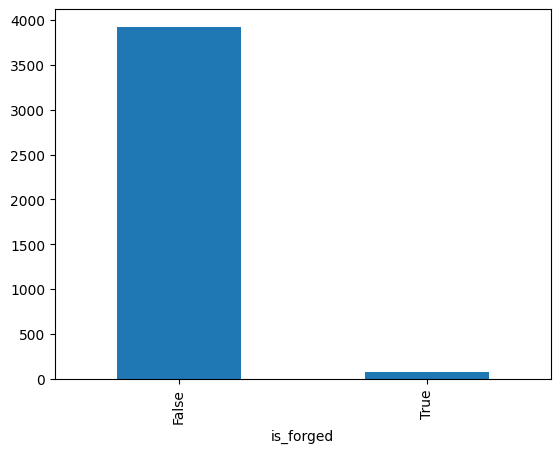

In [31]:
merged['is_forged'].value_counts().plot(kind='bar')